**Table of contents**<a id='toc0_'></a>    
- 1. [Problem 1: Production economy and CO2 taxation](#toc1_)    
- 2. [Problem 2: Career choice model](#toc2_)    
- 3. [Problem 3: Barycentric interpolation](#toc3_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=2
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
# Write your code here
import numpy as np
from types import SimpleNamespace

## 1. <a id='toc1_'></a>[Problem 1: Production economy and CO2 taxation](#toc0_)

Consider a production economy with two firms indexed by $j \in \{1,2\}$. Each produce its own good. They solve

$$
\begin{align*}
\max_{y_{j}}\pi_{j}&=p_{j}y_{j}-w_{j}\ell_{j}\\\text{s.t.}\;&y_{j}=A\ell_{j}^{\gamma}.
\end{align*}
$$

Optimal firm behavior is

$$
\begin{align*}
\ell_{j}^{\star}(w,p_{j})&=\left(\frac{p_{j}A\gamma}{w}\right)^{\frac{1}{1-\gamma}} \\
y_{j}^{\star}(w,p_{j})&=A\left(\ell_{j}^{\star}(w,p_{j})\right)^{\gamma}
\end{align*}
$$

The implied profits are

$$
\pi_{j}^*(w,p_{j})=\frac{1-\gamma}{\gamma}w\cdot\left(\frac{p_{j}A\gamma}{w}\right)^{\frac{1}{1-\gamma}}
$$

A single consumer supplies labor, and consumes the goods the firms produce. She also recieves the implied profits of the firm.<br>
She solves:

$$
\begin{align*}
U(p_1,p_2,w,\tau,T) = \max_{c_{1},c_{2},\ell} & \log(c_{1}^{\alpha}c_{2}^{1-\alpha})-\nu\frac{\ell^{1+\epsilon}}{1+\epsilon} \\
\text{s.t.}\,\,\,&p_{1}c_{1}+(p_{2}+\tau)c_{2}=w\ell+T+\pi_{1}^*(w,p_{1})+\pi_{2}^*(w,p_{2})
\end{align*}
$$

where $\tau$ is a tax and $T$ is lump-sum transfer. <br>
For a given $\ell$, it can be shown that optimal behavior is

$$
\begin{align*}
c_{1}(\ell)&=\alpha\frac{w\ell+T+\pi_{1}^*(w,p_{1})+\pi_{2}^*(w,p_{2})}{p_{1}} \\
c_{2}(\ell)&=(1-\alpha)\frac{w\ell+T+\pi_{1}^*(w,p_{1})+\pi_{2}^*(w,p_{2})}{p_{2}+\tau} \\
\end{align*}
$$
Such that optimal behavior is:
$$
\ell^* = \underset{\ell}{\arg\max} \log(\left(c_{1}(\ell)\right)^{\alpha}\cdot \left(c_{2}(\ell)\right)^{1-\alpha})-\nu\frac{\ell^{1+\epsilon}}{1+\epsilon} 
$$
With optimal consumption:
$$
\begin{align*}
c_1^*=c_{1}(\ell^*) \\
c_2^*=c_{2}(\ell^*)\\
\end{align*}
$$


The government chooses $\tau$ and balances its budget so $T=\tau c_2^*$. We initially set $\tau,T=0$.

Market clearing requires:

1. Labor market: $\ell^* = \ell_1^* + \ell_2^*$
1. Good market 1: $c_1^* = y_1^*$
1. Good market 2: $c_2^* = y_2^*$


**Question 1:** Check market clearing conditions for $p_1$ in `linspace(0.1,2.0,10)` and $p_2$ in `linspace(0.1,2.0,10)`. We choose $w=1$ as numeraire.

In [2]:
# call on the class 
from exam2024_final import ProductionEconomy
problem1 = ProductionEconomy()


In [3]:
problem1.question_1()

The market for good 1 does not clear.
The market for good 2 does not clear.


***Answer:*** We have solved the consumer's optimization problem by finding her optimal labor supply. We then compute her optimal consumption of the two goods. We compare with the firm's optimal production. We find that for the given price grids, the markets do not clear.

**Question 2:** Find the equilibrium prices $p_1$ and $p_2$.<br>
*Hint: you can use Walras' law to only check 2 of the market clearings*

In [4]:
problem1.question_2()

Equilibrium prices: p1 = 0.9759461342924438, p2 = 1.4907888416190942


***Answer:*** As in question 1, we use Walras' law to find the equilibrium. We here find that the equilbrium prices are
$p1=0.98$ and $p2=1.49$. We see that the prices are within the range given in question 1, which suggests that the markets did not clear, because the grid perhaps was not fine enough.


Assume the government care about the social welfare function:

$$
SWF = U - \kappa y_2^*
$$

Here $\kappa$ measures the social cost of carbon emitted by the production of $y_2$ in equilibrium.

**Question 3:** What values of $\tau$ and (implied) $T$ should the government choose to maximize $SWF$?

In [5]:
problem1.question_3()

The optimal CO2 tax is: 1.0
The maximum social welfare given the optimal CO2 tax is: 0.6498956597908837
The implied T is: 0.4674401986108434


**Answer:** Maximizing the social welfare function yields an optimal co2 tax of 1.0, social welfare of 0.65 and an implied lump sum transfer of 0.47. However, we see that this result equals the upper bound of the range in which we allow $\tau$ to be. We have checked for multiple upper bounds. This insinuates an issue with our optimization problem, where the social welfare function is strictly rising with the co2 tax. This implies that our code does not capture the channels where $\tau$ has a negative effect on the utility. A higher tax of $\tau$ would directly affect her consumption of good 2 negatively. A higher tax affects the lump sum transfer positively (direct effect) and negatively (indirect effect) through the negative effect on the consumption on good 2.


## 2. <a id='toc2_'></a>[Problem 2: Career choice model](#toc0_)

Consider a graduate $i$ making a choice between entering $J$ different career tracks. <br>
Entering career $j$ yields utility $u^k_{ij}$. This value is unknown to the graduate ex ante, but will ex post be: <br>
$$
    u_{i,j}^k = v_{j} + \epsilon_{i,j}^k
$$

They know that $\epsilon^k_{i,j}\sim \mathcal{N}(0,\sigma^2)$, but they do not observe $\epsilon^k_{i,j}$ before making their career choice. <br>

Consider the concrete case of $J=3$ with:
$$
\begin{align*}
    v_{1} &= 1 \\
    v_{2} &= 2 \\
    v_{3} &= 3
\end{align*}
$$

If the graduates know the values of $v_j$ and the distribution of $\epsilon_{i,j}^k$, they can calculate the expected utility of each career track using simulation: <br>
$$
    \mathbb{E}\left[ u^k_{i,j}\vert v_j \right] \approx v_j + \frac{1}{K}\sum_{k=1}^K \epsilon_{i,j}^k
$$

In [6]:
par = SimpleNamespace()
par.J = 3
par.N = 10
par.K = 10000
par.sigma = 2
par.v = np.array([1, 2, 3])
par.c = 1

from exam2024_final import CareerChoiceModel
problem2 = CareerChoiceModel(par)



**Question 1:** Simulate and calculate expected utility and the average realised utility for $K=10000$ draws, for each career choice $j$.


**Answer:**

The expected value of $\epsilon_{i,j}^k$ is 0. Thereby, the expected utility is simply $v_j$. <br>

The average realized utility includes $\epsilon$ which we draw from a random seed. We calculate the actual utility by adding the simulated $\epsilon_{i,j}^k$ values to $v_j$ and then take the average of this.

In [7]:
problem2.question_1()

Average expected utility for each career choice j:
Career 1: 1
Career 2: 2
Career 3: 3

Average realized utility for each career choice j:
Career 1: 0.9631325596834683
Career 2: 2.0219760117458887
Career 3: 2.9886743168786


We see that the average realized utility differs a little from the expected utility. This is due to the noise term $\epsilon_{i,j}^k$. While the expected value of $\epsilon_{i,j}^k$ is 0, the realized values are simulated, and the average of them differs a little from 0.

------

Now consider a new scenario: Imagine that the graduate does not know $v_j$. The *only* prior information they have on the value of each job, comes from their $F_{i}$ friends that work in each career $j$. After talking with them, they know the average utility of their friends (which includes their friends' noise term), giving them the prior expecation: <br>
$$
\tilde{u}^k_{i,j}\left( F_{i}\right) = \frac{1}{F_{i}}\sum_{f=1}^{F_{i}} \left(v_{j} + \epsilon^k_{f,j}\right), \; \epsilon^k_{f,j}\sim \mathcal{N}(0,\sigma^2)
$$
For ease of notation consider that each graduate have $F_{i}=i$ friends in each career. <br>

For $K$ times do the following: <br>
1. For each person $i$ draw $J\cdot F_i$ values of $\epsilon_{f,j}^{k}$, and calculate the prior expected utility of each career track, $\tilde{u}^k_{i,j}\left( F_{i}\right)$. <br>
Also draw their own $J$ noise terms, $\epsilon_{i,j}^k$
1. Each person $i$ chooses the career track with the highest expected utility: $$j_i^{k*}= \arg\max_{j\in{1,2\dots,J}}\left\{ \tilde{u}^k_{i,j}\left( F_{i}\right)\right\} $$
1. Store the chosen careers: $j_i^{k*}$, the prior expectation of the value of their chosen career: $\tilde{u}^k_{i,j=j_i^{k*}}\left( F_{i}\right)$, and the realized value of their chosen career track: $u^k_{i,j=j_i^{k*}}=v_{j=j_i^{k*}}+\epsilon_{i,j=j_i^{k*}}^k$.

Chosen values will be: <br>
$i\in\left\{1,2\dots,N\right\}, N=10$ <br>
$F_i = i$<br>
So there are 10 graduates. The first has 1 friend in each career, the second has 2 friends, ... the tenth has 10 friends.

**Question 2:** Simulate and visualize: For each type of graduate, $i$, the share of graduates choosing each career, the average subjective expected utility of the graduates, and the average ex post realized utility given their choice. <br>
That is, calculate and visualize: <br>
$$
\begin{align*}
    \frac{1}{K} \sum_{k=1}^{K} \mathbb{I}\left\{ j=j_i^{k*} \right\}  \;\forall j\in\left\{1,2,\dots,J\right\}
\end{align*}
$$
$$
\begin{align*}
    \frac{1}{K} \sum_{k=1}^{K} \tilde{u}^k_{ij=j_i^{k*}}\left( F_{i}\right)
\end{align*}
$$
And 
$$
\begin{align*}
    \frac{1}{K} \sum_{k=1}^{K} u^k_{ij=j_i^{k*}} 
\end{align*}
$$
For each graduate $i$.

**Answer:**

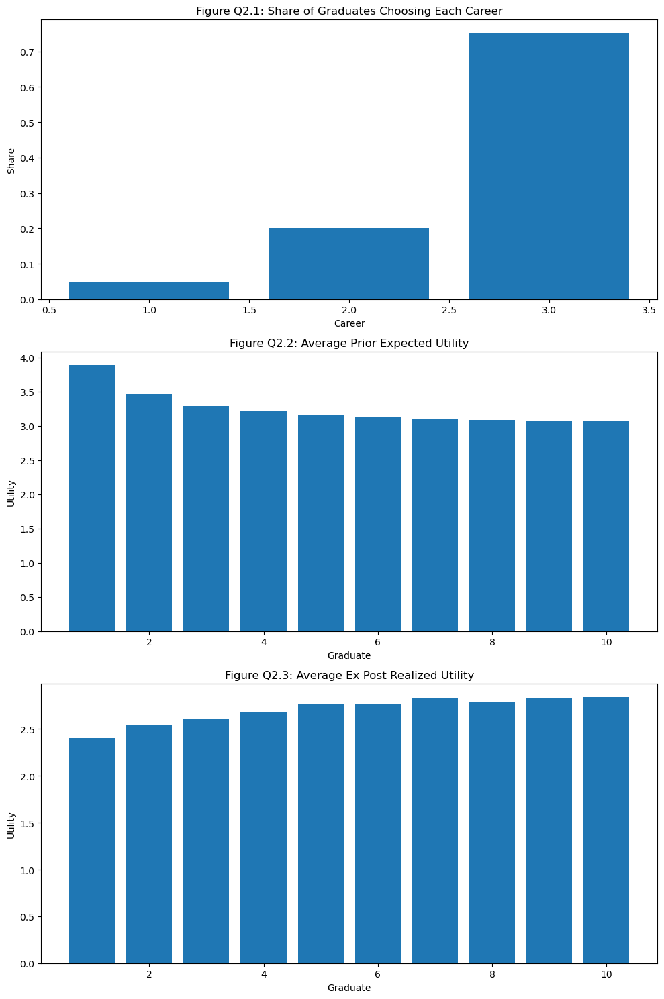

In [8]:
problem2.question_2()

Figure Q2.1 (Share of Graduates Choosing Each Career) shows that Career 3 is chosen by approximately 75% of the graduates, Career 2 by 20%, and Career 1 by 5%. These percentages represent the distribution of choices across all simulated scenarios. This means that across all simulations, on average, 5% of the graduates choose career 1.\
Career 3 is the most attractive career among the graduates. This is likely due to the higher expected utility of career compared to the other careers.

Figure Q2.2 (Average Prior Expected Utility) shows that graduate 1 has the highest average prior expected utility and that it is declining for each graduate, implying that graduate 10 has the lowest average prior expected utility.\
This pattern suggests that the graduates with few friends receive high utilities from their friends, implying a high expected utility for the graduates with few friends. As the number of friends increases for each graduate, the average prior expected utility decreases. This could be because of the dilution effect of more varied opinions from their friends.

Figure Q2.3 (Average Ex Post Realized Utility) shows that the realized utility is lowest for graduate 1, and increasing for each graduate. This suggests that graduate 1 experiences more (average) bias from the one friend, leading her to choose a career with lower realized utility, compared to graduate 10 who know the utility of 10 persons in each career.

Comparing Figure Q2.2 and Figure Q2.3, we see that the more friends the graduate has, the less difference there is between the prior expected utility and the ex post realized utility. I.e., it is an advantage to know many people in each career as that gives the graduate the most accurate picture of the utility in each career.

-----

After a year of working in their career, the graduates learn $u^k_{ij}$ for their chosen job $j_i^{k*}$ perfectly. <br>
The can switch to one of the two remaining careers, for which they have the same prior as before, but it will now include a switching cost of $c$ which is known.
Their new priors can be written as: 
$$
\tilde{u}^{k,2}_{ij}\left( F_{i}\right) = \begin{cases}
            \tilde{u}^k_{ij}\left( F_{i}\right)-c & \text{if } j \neq j_i^{k*} \\
            u_{ij=j_i^{k*}} & \text{if } j = j_i^{k*}
        \end{cases}
$$

We will set $c=1$.

Their realized utility will be: <br>
$$
u^{k,2}_{ij}= \begin{cases}
            u_{ij}^k -c & \text{if } j \neq j_i^{k*} \\
            u_{ij=j_i^{k*}} & \text{if } j = j_i^{k*}
        \end{cases}
$$

**Question 3:** Following the same approach as in question 2, find the new optimal career choice for each $i$, $k$. Then for each $i$, calculate the average subjective expected utility from their new optimal career choice, and the ex post realized utility of that career. Also, for each $i$, calculate the share of graduates that chooses to switch careers, conditional on which career they chose in the first year. <br>

**Answer:**


The new optimal career choice for each i, k:
Graduate 1:
  Draw 1:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 5.06
  Draw 2:
    Chosen Career: 3
    Prior Expectation: 2.00
    Realized Value: 4.66
  Draw 3:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 3.19
  Draw 4:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 4.84
  Draw 5:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: -1.02
  Draw 6:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 1.66
  Draw 7:
    Chosen Career: 3
    Prior Expectation: 2.00
    Realized Value: 4.98
  Draw 8:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 2.68
  Draw 9:
    Chosen Career: 2
    Prior Expectation: 2.00
    Realized Value: 2.01
  Draw 10:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 3.46
  Draw 11:
    Chosen Career: 3
    Prior Expectation: 3.00
    Realized Value: 1.33
  Draw 12:
    

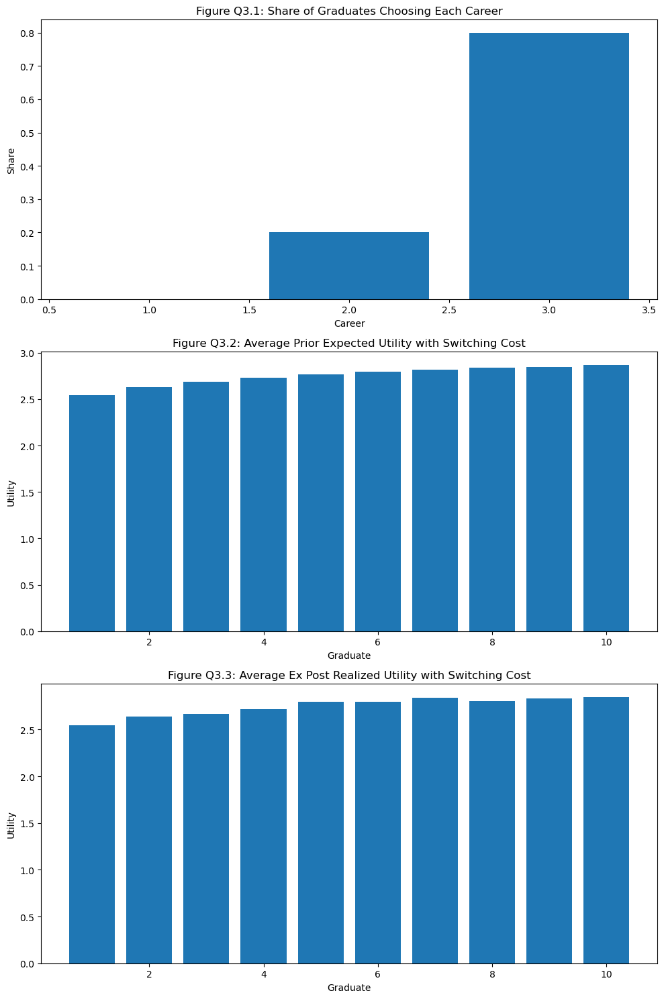


Table Q3.1: The table shows the average, optimal career choice for each i, the prior expected utility, and ex post realized utility for new optimal career choices: 

    Career Choice  Avg Prior Expected Utility  Avg Ex Post Realized Utility
1               3                      2.5439                      2.548637
2               3                      2.6320                      2.641134
3               3                      2.6834                      2.669476
4               3                      2.7338                      2.720802
5               3                      2.7649                      2.798255
6               3                      2.7945                      2.797308
7               3                      2.8185                      2.842564
8               3                      2.8372                      2.805874
9               3                      2.8482                      2.836091
10              3                      2.8665                      2.8464

In [9]:
problem2.question_3()

First, we print all the new optimal career choices for each i, k, the prior expected utility, and the realized utility. 

Then, we visualize the average results in the figures. Figure Q3.1 shows that after the opportunity to switch careers, none of the graduates chooses career 1. Across all simulations, on average, 20% of the graduates choose career 2, while 80% choose career 3.

Figure Q3.2, Figure Q3.3, and Table Q3.1 shows that the average prior expected utility and the average ex post realized utility are very close to each other for all graduates. 
However, it does seem weird, that the table shows that all graduates choose career 3, even though the figure shows that 20% of the graduates choose career 2. This might be because the figure shows the distribution of chosen career across all simulations but that the optimal chosen career is career 3 for all graduates.

Table Q3.2 reveals that all graduates from career 1 switch careers when given the opportunity. However, graduates from career 1 are the only ones who choose to switch careers. None of the graduates initially in career 2 or 3 choose to switch. Figure Q3.1 suggests that graduates from career 1 tend to move to career 3, as the figure shows a 5 percentage point increase for career 3. For graduates in career 2, it seems they do not find it beneficial to switch to career 3. This decision is likely due to the fact that the switching cost is 1, which means the utility of staying in career 2 is similar to switching to career 3. Moreover, there's an element of uncertainty associated with switching careers.

## 3. <a id='toc3_'></a>[Problem 3: Barycentric interpolation](#toc0_)

**Problem:** We have a set of random points in the unit square,

$$
\mathcal{X} = \{(x_1,x_2)\,|\,x_1\sim\mathcal{U}(0,1),x_2\sim\mathcal{U}(0,1)\}.
$$

For these points, we know the value of some function $f(x_1,x_2)$,

$$
\mathcal{F} = \{f(x_1,x_2) \,|\, (x_1,x_2) \in \mathcal{X}\}.
$$

Now we want to approximate the value $f(y_1,y_2)$ for some  $y=(y_1,y_2)$, where $y_1\sim\mathcal{U}(0,1)$ and $y_2\sim\mathcal{U}(0,1)$.

**Building block I**

For an arbitrary triangle $ABC$ and a point $y$, define the so-called barycentric coordinates as:

$$
\begin{align*}
  r^{ABC}_1 &= \frac{(B_2-C_2)(y_1-C_1) + (C_1-B_1)(y_2-C_2)}{(B_2-C_2)(A_1-C_1) + (C_1-B_1)(A_2-C_2)} \\
  r^{ABC}_2 &= \frac{(C_2-A_2)(y_1-C_1) + (A_1-C_1)(y_2-C_2)}{(B_2-C_2)(A_1-C_1) + (C_1-B_1)(A_2-C_2)} \\
  r^{ABC}_3 &= 1 - r_1 - r_2.
\end{align*}
$$

If $r^{ABC}_1 \in [0,1]$, $r^{ABC}_2 \in [0,1]$, and $r^{ABC}_3 \in [0,1]$, then the point is inside the triangle.

We always have $y = r^{ABC}_1 A + r^{ABC}_2 B + r^{ABC}_3 C$.

**Building block II**

Define the following points:

$$
\begin{align*}
A&=\arg\min_{(x_{1},x_{2})\in\mathcal{X}}\sqrt{\left(x_{1}-y_{1}\right)^{2}+\left(x_{2}-y_{2}\right)^{2}}\text{ s.t. }x_{1}>y_{1}\text{ and }x_{2}>y_{2}\\
B&=\arg\min_{(x_{1},x_{2})\in\mathcal{X}}\sqrt{\left(x_{1}-y_{1}\right)^{2}+\left(x_{2}-y_{2}\right)^{2}}\text{ s.t. }x_{1}>y_{1}\text{ and }x_{2}<y_{2}\\
C&=\arg\min_{(x_{1},x_{2})\in\mathcal{X}}\sqrt{\left(x_{1}-y_{1}\right)^{2}+\left(x_{2}-y_{2}\right)^{2}}\text{ s.t. }x_{1}<y_{1}\text{ and }x_{2}<y_{2}\\
D&=\arg\min_{(x_{1},x_{2})\in\mathcal{X}}\sqrt{\left(x_{1}-y_{1}\right)^{2}+\left(x_{2}-y_{2}\right)^{2}}\text{ s.t. }x_{1}<y_{1}\text{ and }x_{2}>y_{2}.
\end{align*}
$$

**Algorithm:**

1. Compute $A$, $B$, $C$, and $D$. If not possible return `NaN`.
1. If $y$ is inside the triangle $ABC$ return $r^{ABC}_1 f(A) + r^{ABC}_2 f(B) + r^{ABC}_3 f(C)$.
1. If $y$ is inside the triangle $CDA$ return $r^{CDA}_1 f(C) + r^{CDA}_2 f(D) + r^{CDA}_3 f(A)$.
1. Return `NaN`.



In [10]:
from exam2024_final import BarycentricInterpolation
problem3 = BarycentricInterpolation()

**Questions 1:** Find $A$, $B$, $C$ and $D$. Illustrate these together with $X$, $y$ and the triangles $ABC$ and $CDA$.

A: [0.26071605 0.43635845]
B: [0.21315735 0.274245  ]
C: [0.10056103 0.27951775]
D: [0.20634391 0.44272557]


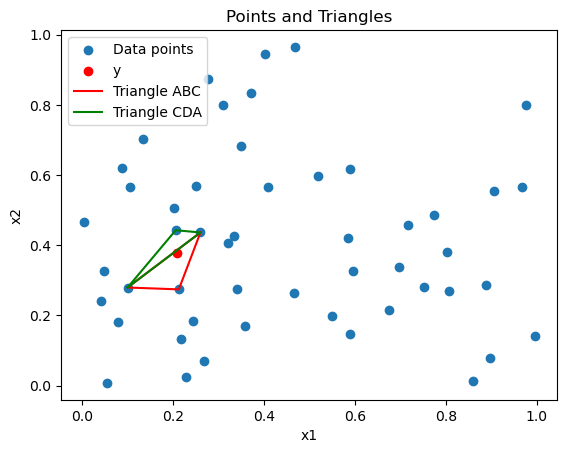

In [11]:
problem3.question1()

***Answer:***
We have computed the random set $X$ in the unit square above. We also show the four points (A,B,C,D) in the figure.

**Question 2:** Compute the barycentric coordinates of the point $y$ with respect to the triangles $ABC$ and $CDA$. Which triangle is $y$ located inside?

In [12]:
problem3.question2()

Barycentric coordinates for triangle ABC: (0.6286263152916166, 0.06910145494351515, 0.3022722297648682)
Barycentric coordinates for triangle CDA: (0.3682598757102867, -0.13392661883334067, 0.765666743123054)
y is inside the triangle ABC


***Answer:*** We find the barycentric coordinates for the two triangles below.
As the coordinates show, the coordinate for D is negative, which means that y is not in that triangle. We can also determine that in the figure above.

Now consider the function:
$$
f(x_1,x_2) = x_1 \cdot x_2
$$

**Question 3:** Compute the approximation of $f(y)$ using the full algorithm. Compare with the true value.

In [13]:
problem3.question3()

Approximated f(y): 0.08405201731052576
True f(y): 0.0789565216259594


***Answer***: We find the approximated value of the function by interpolation, and sees that it is close to the true value. The approx. value is about 6.5% too large.

**Question 4:** Repeat question 3 for all points in the set $Y$.

In [14]:
problem3.question4()

Approximated f(y) = 0.04032631372248057, True f(y) = 0.04000000000000001

Approximated f(y) = 0.15874233999349835, True f(y) = 0.16000000000000003

Approximated f(y) = nan, True f(y) = 0.6400000000000001

Approximated f(y) = 0.15874233999349835, True f(y) = 0.16000000000000003

Approximated f(y) = 0.2512901561119622, True f(y) = 0.25



***Answer:*** We have found the approximated and true values of the function, and see that the approximations are close to the true values. However, for the point \( y = (0.8, 0.8) \), there were no points in the dataset $X$ such that $x_1 > 0.8$ and $x_2 > 0.8$, resulting in $A$ being `None`. Consequently, the interpolation could not proceed, and the approximated value of $f(y)$ is `nan`. This can also be seen in the figure.